# Práctica 3: Caracterización y Clasificación de Texturas
## Gabriel Daniel Aguilar Luna, Zuriel Uzai Rodrígez Agiss
### _Facultad de Ingenierría, Universidad Nacional Autónoma de México_
### _Ciudad de México, México_
#### gabriel.aguilar@ingenieria.unam.edu,  zurieluzai2015@gmail.com

***

### __1. Objetivos__

El alumno:
- Desarrollará métodos de caracterización de texturas
- Aprenderáa utilizar clasificadores como K-NN,K-Means omáquinas de soporte vectoria

***

### __2. Introducción__


### aqui se investiga.

aqui se investiga.

***

### __3. Desarrollo__

##### Imports y funciones

In [1]:
import matplotlib.pyplot as plt
import cv2
import skimage as ski
import PIL as pil
import imageio as io
import numpy as np
from PIL import Image, ImageFilter
from shapely.geometry import Polygon, MultiPolygon
from descartes import PolygonPatch
from math import log
from sklearn.neighbors import KNeighborsClassifier

# Esta funcion 'desdobla' cadenas para crear un rango y un numero
# eg: '100'=mayores que 100, '0-50'= entre 0 y 50, '10-20,500'= entre 10 y 20 o mayores de 500
def listRanger(rango: str):
    # Separa la cadena por comas
    rango = rango.split(',')
    # Definicion de las variables de retorno
    listarango = []
    mayorq = -1
    # Recorre las sentencias separadas anteriormente
    for x in rango:
        # Si la sentencia tiene un '-' es un rango
        if '-' in x:
            # Los rangos se añaden a la lista listarango
            listax = x.split('-')
            listarango += list(range(int(listax[0]),int(listax[1])))
        # Si no, es una cota inferior
        else:
            # Solo puede existir una de estas cotas en la sentencia
            mayorq = int(x)

    return [listarango, mayorq]

# Esta función imprime la imagen junto con las curvas de la posición nColl de contornos
# Que cumplan con range y retorna un arreglo con dichas curvas.
# Se puede especificar los puntos en el perimetro de las lineas con range. eg: range='400-560'
# Si no se especifica se utiliza '150'
# Se puede especificar un nombre para guardar la imagen resultante con save. eg: save='imagen2.png'
# Si no se especifica se utiliza 'ImCrTMP.png'
# eg: masker.printImCr(fruta, fruta_contornos, 1, range='200', save='comida_contornos.png')
def printImCr(imagen, contornos, nColl, **kwargs):
    # Desdobla range
    rangolstd = listRanger(kwargs["range"] if ("range" in kwargs) else '150')
    # Define variable de retorno
    curvas_array = []
    # Con este for se muestran todas las lineas cuya primera dimension entre en el rango
    for i in contornos.collections[nColl].get_paths():
        # Si cumple con las caracteristicas indicadas en range se añade al plot y a la var de retorno
        if len(i.vertices) in rangolstd[0] or ((len(i.vertices) > rangolstd[1]) if (rangolstd[1] != -1) else (len(i.vertices) > len(i.vertices)+1)):
            plt.plot(i.vertices[:,0], i.vertices[:,1], '--b')
            curvas_array.append(i.vertices)
    # Muestra la imagen
    plt.imshow(imagen)
    plt.axis('off')
    # Salva la imagen
    plt.savefig('resultados/'+kwargs["save"] if ("save" in kwargs) else 'resultados/ImCrTMP.png', bbox_inches='tight', transparent=False, pad_inches = 0)
    # Regresa el arreglo
    return curvas_array

# Esta función imprime la imagen de fondo junto con los poligonos
# Definidos por las curvas en curvas_arr
# Retorna un obj Multipolygon
def printImPoly(curvas_arr, fondo):
    # Arreglo aux
    poly_array = []
    # Recorre arreglo de curvas
    for crvua in curvas_arr:
        x = crvua[:,0]
        y = crvua[:,1]
        poly_array.append(Polygon([(i[0], i[1]) for i in zip(x,y)]))
    polygons = MultiPolygon(poly_array)
    #len(polygons.geoms)
    #polygons
    fig = plt.figure() 
    ax = fig.gca()

    # Plotea la imagen de fondo
    plt.imshow(fondo)
    # Plotea los poligonos
    for poly in polygons:
        ax.add_patch(PolygonPatch(poly))
    #ax.axis('scaled')
    plt.show()
    # Retorna los poligonos
    return polygons

def listaclase(clase, n=4):
    clase_array = []
    for i in range(n):
        objeto = io.imread('entrenamiento-procesado/Entrenamiento'+str(i+1)+'-'+ clase +'_gaussianBlur.jpg')
        clase_array.append(np.array(objeto))
        plt.imshow(objeto)
        plt.show()
    return clase_array

def pixelsMatrix(clase, n=4):
    lista_clase = listaclase(clase, n)
    pixeles_clase = []
    for objeto in lista_clase:
        for renglon in objeto:
            for pixel in renglon:
                if pixel.mean() > 0.:
                    pixeles_clase.append(pixel)
    return np.array(pixeles_clase)

def pixelsMatrix_blanco(clase, n=6):
    lista_clase = listaclase(clase, n)
    pixeles_clase = []
    pixeles_probados = 0
    for objeto in lista_clase:
        for renglon in objeto:
            for pixel in renglon:
                pixeles_probados += 1
                if pixel.mean() < 250.:
                    pixeles_clase.append(pixel)
    return np.array(pixeles_clase), pixeles_probados

def getSigma(matriz_pix):
    MU = np.mean(matriz_pix, axis=0)
    SIGMA = np.zeros((len(MU),len(MU)))

    for pixel in matriz_pix:
        P_MU = np.array([pixel-MU])
        SIGMA += np.dot(np.transpose(P_MU),P_MU)
    
    return SIGMA / len(matriz_pix)

def probaClase(lenClase, x, y, n):
    return lenClase/(x*y*n)

def ladoDerecho(SIGMA_det, probaClase):
    return (-log(SIGMA_det)/2) + log(probaClase)

def probaPixClase(pixel, MU, SIGMA_inv):
    P_MU = np.array([pixel-MU])
    #print((np.dot(np.dot(P_MU,SIGMA_inv), np.transpose(P_MU))[0,0])/-2)
    return (np.dot(np.dot(P_MU,SIGMA_inv), np.transpose(P_MU))[0,0])/-2

def clasificador(imagen, MUs, SIGMAs_inv, ldDers, colores, **kwargs):
    show = (kwargs["show"] if ("show" in kwargs) else False)
    if (isinstance(imagen, str)):
        prueba_img = io.imread(imagen)
        prueba = np.array(prueba_img)
    elif(isinstance(imagen, np.ndarray)):
        prueba = imagen
    if show:    
        plt.imshow(prueba)
        plt.show()
    
    dimensiones = prueba.shape
    resultado = np.zeros((dimensiones[0],dimensiones[1],3), dtype=int)
    for i in range(len(prueba)):
        for j in range(len(prueba[i])):
            arr_aux = []
            for n in range(len(MUs)):
                arr_aux.append(probaPixClase(prueba[i][j], MUs[n], SIGMAs_inv[n])+ldDers[n])
            resultado[i][j]= colores[arr_aux.index(max(arr_aux))]
    return resultado

def makeGaussian(nombre_imagen, valor_radio = 3):        
    #codigo de internet para aplicar filtro Gaussiano xd
    #Abriendo imagen con Image
    image = Image.open(nombre_imagen)

    #Aplicando el filtro de Gaussiano
    #Con un valor para el radio igual a 3
    image = image.filter(ImageFilter.GaussianBlur(radius = valor_radio))

    #Se muestra la imagen
    image.show()

    #Se gurada esta nueva imagen borrosa
    #image.save(nombre_imagen[:-4]+"_gaussianBlur.jpg")

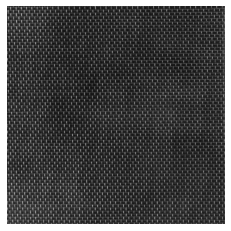

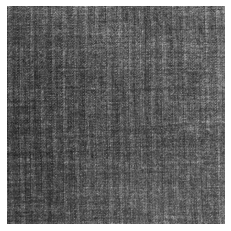

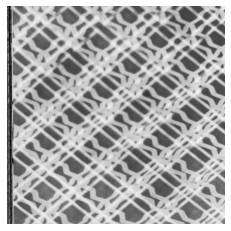

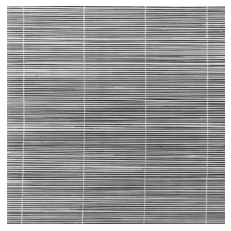

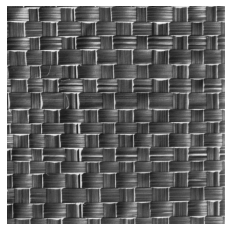

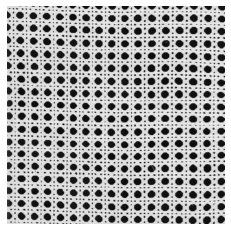

In [2]:
def listaTexturas(text_names):
    texturas_array = []
    for text_name in text_names:
        objeto = io.imread('texturas/D'+text_name+'.bmp')
        texturas_array.append(np.array(objeto)[:,:,0])
        plt.imshow(objeto)
        plt.axis('off')
        plt.show()
    return texturas_array

texturas_array = listaTexturas(['6','16','46','49','64','101'])

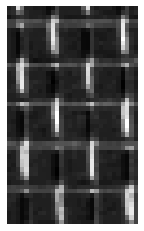

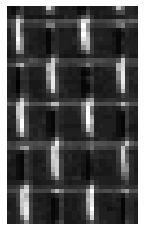

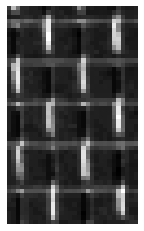

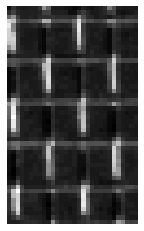

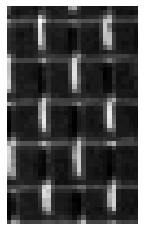

...

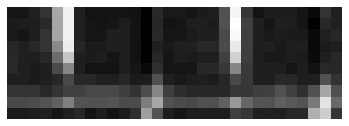

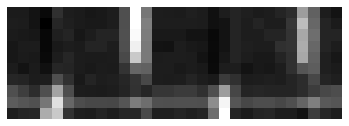

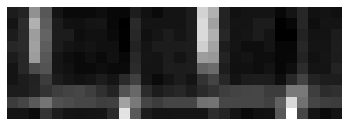

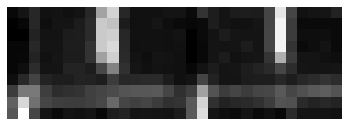

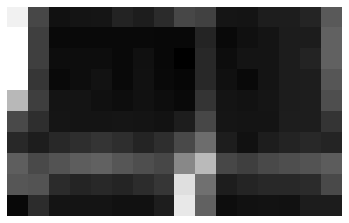

In [3]:
def windowMaker(imagen,window_length,window_height,**kwargs):
    Y, X = imagen.shape
    windows_array = []
    length_overlap = (kwargs["length_overlap"] if ("length_overlap" in kwargs) else 0)
    height_overlap = (kwargs["height_overlap"] if ("height_overlap" in kwargs) else 0)
    show = (kwargs["show"] if ("show" in kwargs) else False)
    for texel_renglon in range(0,Y,window_height-height_overlap):
        for texel_startP in range(0,X,window_length-length_overlap):
            ventana = imagen[texel_renglon:texel_renglon+window_height,texel_startP:texel_startP+window_length]
            windows_array.append(ventana)
            if (show):
                plt.imshow(ventana, cmap=plt.cm.gray)
                plt.axis('off')
                plt.show()
    return windows_array
ventanas1 = windowMaker(texturas_array[0],30,50,length_overlap=6,height_overlap=8,show=True)

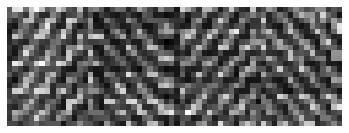

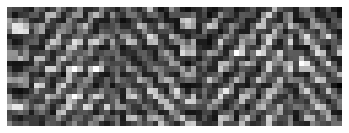

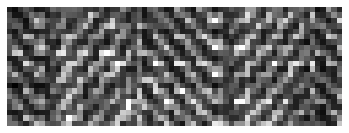

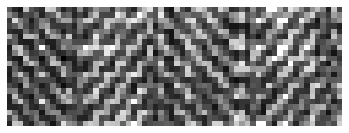

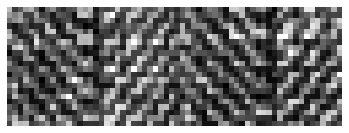

...

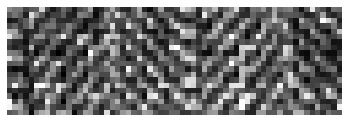

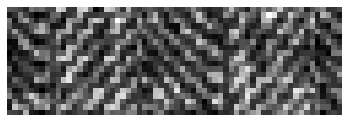

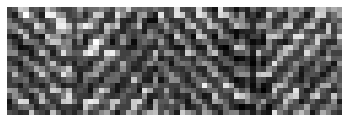

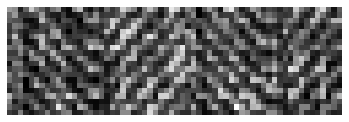

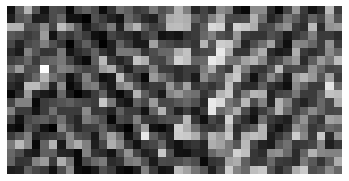

In [4]:
ventanas2 = windowMaker(texturas_array[1],62,22,length_overlap=2,height_overlap=2,show=True)

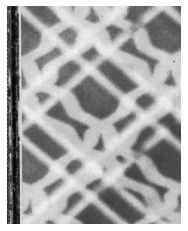

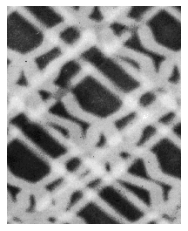

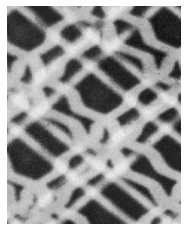

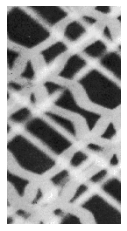

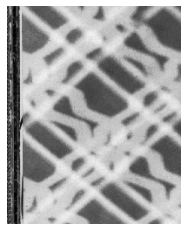

...

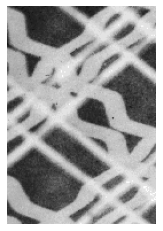

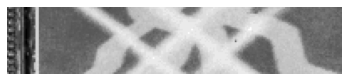

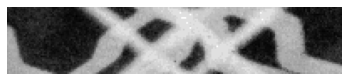

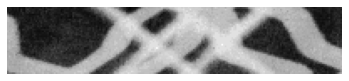

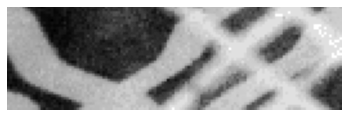

In [5]:
ventanas3 = windowMaker(texturas_array[2],200,250,length_overlap=30,height_overlap=100,show=True)

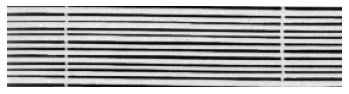

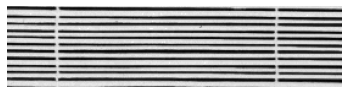

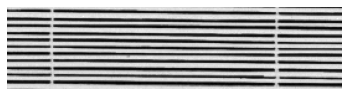

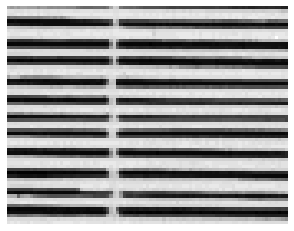

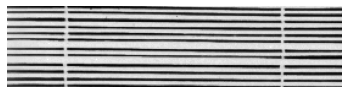

...

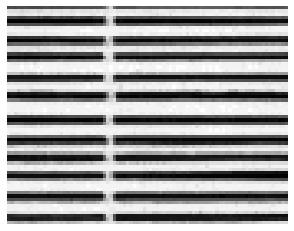

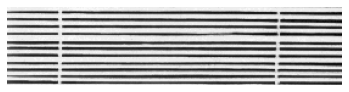

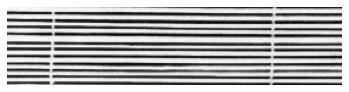

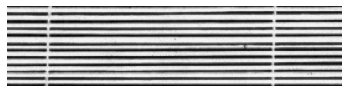

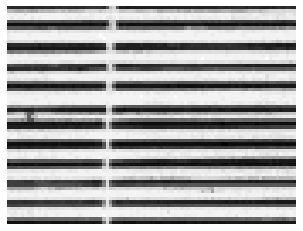

In [6]:
ventanas4 = windowMaker(texturas_array[3],275,66,length_overlap=90,height_overlap=2,show=True)

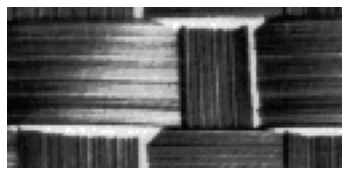

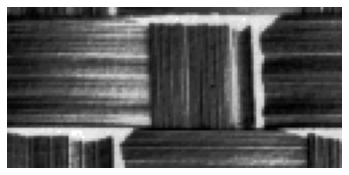

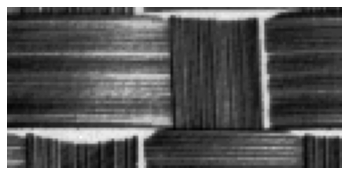

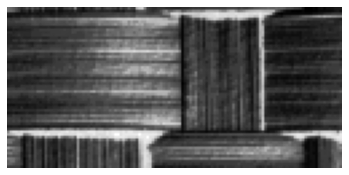

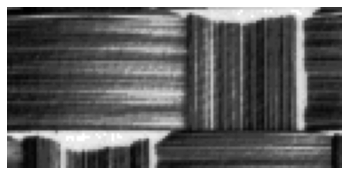

...

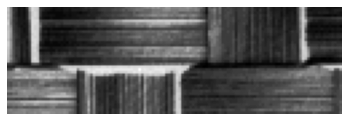

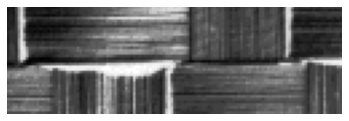

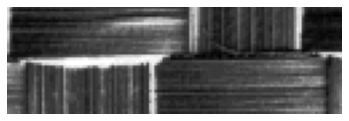

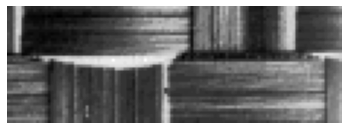

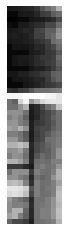

In [7]:
ventanas5 = windowMaker(texturas_array[4],125,60,length_overlap=20,height_overlap=20,show=True)

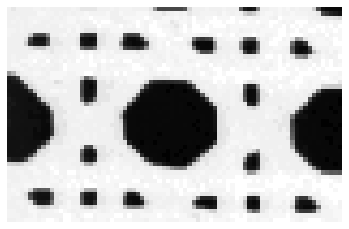

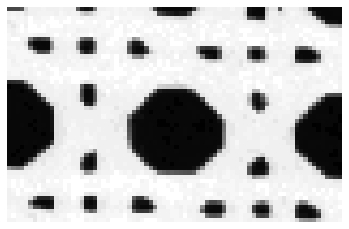

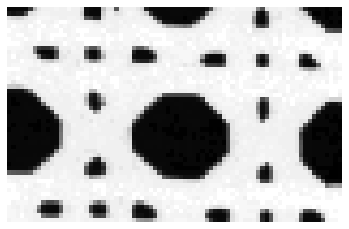

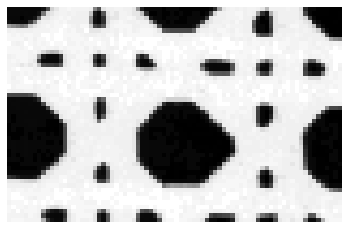

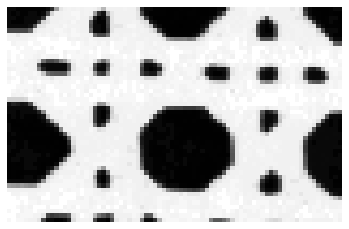

...

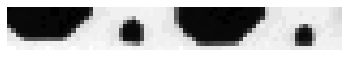

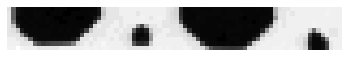

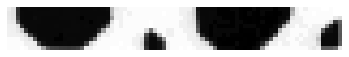

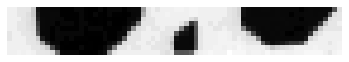

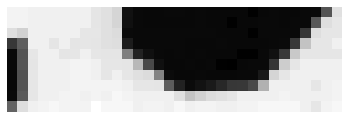

In [8]:
ventanas6 = windowMaker(texturas_array[5],78,50,length_overlap=40,height_overlap=8,show=True)

### Funciones de obtención de matrices GLCM

In [9]:
def glcmMaker_h(ventana, norm = False): 
    matriz_auxiliar = np.zeros((np.amax(ventana)+1,)*2, dtype=int)
    Y, X = ventana.shape
    normalizador = 0
    for renglon in ventana:
        for j in range(X-1):
            matriz_auxiliar[renglon[j]][renglon[j+1]] += 1
            normalizador += 2
    glcm = matriz_auxiliar + np.transpose(matriz_auxiliar)
    return (glcm/normalizador) if norm else glcm

def glcmMaker_v(ventana, norm = False): 
    matriz_auxiliar = np.zeros((np.amax(ventana)+1,)*2, dtype=int)
    Y, X = ventana.shape
    normalizador = 0
    for i in range(Y-1):
        for j in range(X):
            matriz_auxiliar[ventana[i][j]][ventana[i+1][j]] += 1
            normalizador += 2
    glcm = matriz_auxiliar + np.transpose(matriz_auxiliar)
    return (glcm/normalizador) if norm else glcm

def glcmMaker_45(ventana, norm = False): 
    matriz_auxiliar = np.zeros((np.amax(ventana)+1,)*2, dtype=int)
    Y, X = ventana.shape
    normalizador = 0
    for i in range(1,Y):
        for j in range(X-1):
            matriz_auxiliar[ventana[i][j]][ventana[i-1][j+1]] += 1
            normalizador += 2
    glcm = matriz_auxiliar + np.transpose(matriz_auxiliar)
    return (glcm/normalizador) if norm else glcm

def glcmMaker_135(ventana, norm = False): 
    matriz_auxiliar = np.zeros((np.amax(ventana)+1,)*2, dtype=int)
    Y, X = ventana.shape
    normalizador = 0
    for i in range(1,Y):
        for j in range(1,X):
            matriz_auxiliar[ventana[i][j]][ventana[i-1][j-1]] += 1
            normalizador += 2
    glcm = matriz_auxiliar + np.transpose(matriz_auxiliar)
    return (glcm/normalizador) if norm else glcm

### Funciones de obtención de características

In [10]:
def entropy(glcm_n):
    entropia = 0
    for renglon in glcm_n:
        for value in renglon:
            entropia += (value*log(value)) if (value>0) else 0
    return -entropia

def homogeneity(glcm_n):
    homogeneidad = 0
    Y, X = glcm_n.shape
    for i in range(Y):
        for j in range(X):
            homogeneidad += glcm_n[i][j]/(1+abs(i-j))
    return homogeneidad

#Angular Second Moment, Energy
def smoothness(glcm_n):
    ASM = 0
    Y, X = glcm_n.shape
    for i in range(Y):
        for j in range(X):
            ASM += glcm_n[i][j]**2
    return ASM

def contrast(glcm_n,k=2,n=1):
    contraste = 0
    Y, X = glcm_n.shape
    for i in range(Y):
        for j in range(X):
            contraste += ((i-j)**k)*(glcm_n[i][j]**n)
    return contraste

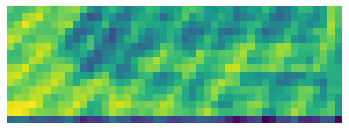

In [11]:
def imagenWEntropy(imagen,window_length,window_height,**kwargs):
    Y, X = imagen.shape
    array_aux = []
    length_overlap = (kwargs["length_overlap"] if ("length_overlap" in kwargs) else 0)
    height_overlap = (kwargs["height_overlap"] if ("height_overlap" in kwargs) else 0)
    mostrar = (kwargs["show"] if ("show" in kwargs) else False)
    for texel_renglon in range(0,Y,window_height-height_overlap):
        renglon_aux = []
        for texel_startP in range(0,X,window_length-length_overlap):
            ventana = imagen[texel_renglon:texel_renglon+window_height,texel_startP:texel_startP+window_length]
            glcm_N = glcmMaker_h(ventana,True)
            renglon_aux.append(entropy(glcm_N))
        array_aux.append(renglon_aux)
    imagen_res = np.array(array_aux)
    if mostrar:
        plt.imshow(imagen_res)
        plt.axis('off')
        plt.show()
    return imagen_res
imagen_entropia = imagenWEntropy(texturas_array[0],20,50,length_overlap=6,height_overlap=8,show=True)

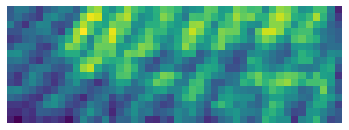

In [12]:
def imagenWHomogeneity(imagen,window_length,window_height,**kwargs):
    Y, X = imagen.shape
    array_aux = []
    length_overlap = (kwargs["length_overlap"] if ("length_overlap" in kwargs) else 0)
    height_overlap = (kwargs["height_overlap"] if ("height_overlap" in kwargs) else 0)
    mostrar = (kwargs["show"] if ("show" in kwargs) else False)
    for texel_renglon in range(0,Y,window_height-height_overlap):
        renglon_aux = []
        for texel_startP in range(0,X,window_length-length_overlap):
            ventana = imagen[texel_renglon:texel_renglon+window_height,texel_startP:texel_startP+window_length]
            glcm_N = glcmMaker_h(ventana,True)
            renglon_aux.append(homogeneity(glcm_N))
        array_aux.append(renglon_aux)
    imagen_res = np.array(array_aux)
    if mostrar:
        plt.imshow(imagen_res)
        plt.axis('off')
        plt.show()
    return imagen_res
imagen_homogeneidad = imagenWHomogeneity(texturas_array[0],20,50,length_overlap=6,height_overlap=8,show=True)

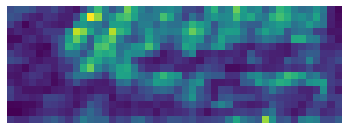

In [13]:
def imagenWSmoothness(imagen,window_length,window_height,**kwargs):
    Y, X = imagen.shape
    array_aux = []
    length_overlap = (kwargs["length_overlap"] if ("length_overlap" in kwargs) else 0)
    height_overlap = (kwargs["height_overlap"] if ("height_overlap" in kwargs) else 0)
    mostrar = (kwargs["show"] if ("show" in kwargs) else False)
    for texel_renglon in range(0,Y,window_height-height_overlap):
        renglon_aux = []
        for texel_startP in range(0,X,window_length-length_overlap):
            ventana = imagen[texel_renglon:texel_renglon+window_height,texel_startP:texel_startP+window_length]
            glcm_N = glcmMaker_h(ventana,True)
            renglon_aux.append(smoothness(glcm_N))
        array_aux.append(renglon_aux)
    imagen_res = np.array(array_aux)
    if mostrar:
        plt.imshow(imagen_res)
        plt.axis('off')
        plt.show()
    return imagen_res
imagen_asm = imagenWSmoothness(texturas_array[0],20,50,length_overlap=6,height_overlap=8,show=True)

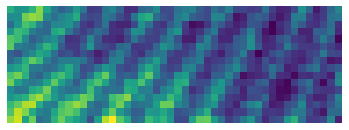

In [14]:
def imagenWContrast(imagen,window_length,window_height,**kwargs):
    Y, X = imagen.shape
    array_aux = []
    length_overlap = (kwargs["length_overlap"] if ("length_overlap" in kwargs) else 0)
    height_overlap = (kwargs["height_overlap"] if ("height_overlap" in kwargs) else 0)
    mostrar = (kwargs["show"] if ("show" in kwargs) else False)
    for texel_renglon in range(0,Y,window_height-height_overlap):
        renglon_aux = []
        for texel_startP in range(0,X,window_length-length_overlap):
            ventana = imagen[texel_renglon:texel_renglon+window_height,texel_startP:texel_startP+window_length]
            glcm_N = glcmMaker_h(ventana,True)
            renglon_aux.append(contrast(glcm_N))
        array_aux.append(renglon_aux)
    imagen_res = np.array(array_aux)
    if mostrar:
        plt.imshow(imagen_res)
        plt.axis('off')
        plt.show()
    return imagen_res
imagen_contraste = imagenWContrast(texturas_array[0],20,50,length_overlap=6,height_overlap=8,show=True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


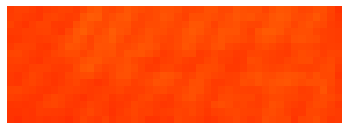

In [15]:
imagenC1 = np.dstack((imagen_entropia,imagen_homogeneidad,imagen_asm,imagen_contraste))
plt.imshow(imagenC1)
plt.axis('off')
plt.show()

In [16]:
def vectorizador(textura,window_l,window_h, **kwargs):
    l_over = (kwargs["length_overlap"] if ("length_overlap" in kwargs) else 0)
    h_over = (kwargs["height_overlap"] if ("height_overlap" in kwargs) else 0)
    mostrar = (kwargs["show"] if ("show" in kwargs) else False)
    entropia = imagenWEntropy(textura,window_l,window_h,length_overlap=l_over,height_overlap=h_over,show=mostrar)
    homogeneidad = imagenWHomogeneity(textura,window_l,window_h,length_overlap=l_over,height_overlap=h_over,show=mostrar)
    smoothness = imagenWSmoothness(textura,window_l,window_h,length_overlap=l_over,height_overlap=h_over,show=mostrar)
    contraste = imagenWContrast(textura,window_l,window_h,length_overlap=l_over,height_overlap=h_over,show=mostrar)
    return np.dstack((entropia,homogeneidad,smoothness,contraste))

In [17]:
imagenC1 = vectorizador(texturas_array[0],82,82,length_overlap=2,height_overlap=2)
imagenC2 = vectorizador(texturas_array[1],82,82,length_overlap=2,height_overlap=2)
imagenC3 = vectorizador(texturas_array[2],200,250,length_overlap=30,height_overlap=100)
imagenC4 = vectorizador(texturas_array[3],275,66,length_overlap=90,height_overlap=2)
imagenC5 = vectorizador(texturas_array[4],125,60,length_overlap=20,height_overlap=20)
imagenC6 = vectorizador(texturas_array[5],78,50,length_overlap=40,height_overlap=8)

### Transformación de datos

In [18]:
# Esta funcion recibe la "imagen" compuesta de caracteristicas y devuelve la lista de "pixeles de caracteristicas"
def pixelsImage(imagen):
    pixeles_clase = []
    for renglon in imagen:
        for pixel in renglon:
            pixeles_clase.append(pixel)
    return np.array(pixeles_clase)
vectCaractTx1 = pixelsImage(imagenC1)
vectCaractTx2 = pixelsImage(imagenC2)
vectCaractTx3 = pixelsImage(imagenC3)
vectCaractTx4 = pixelsImage(imagenC4)
vectCaractTx5 = pixelsImage(imagenC5)
vectCaractTx6 = pixelsImage(imagenC6)

In [19]:
def mostrarColores(colores, **kwargs):
    colormap = np.zeros((100,10,3), dtype=int)
    texturemap = np.zeros((100,10,3), dtype=int)
    fig, ax = plt.subplots()
    for c in range(len(colores)):
        colormap = np.concatenate((colormap,np.full((100,100,3), colores[c]),np.zeros((100,10,3), dtype=int)), axis=1)
        ax.text(50+(110*c),50,'T'+str(c+1), style ='italic', fontsize = 15)
        if ("texturas" in kwargs):
            texturemap = np.concatenate((texturemap,np.dstack((kwargs['texturas'][c][0:100,0:100],kwargs['texturas'][c][0:100,0:100],kwargs['texturas'][c][0:100,0:100])),np.zeros((100,10,3), dtype=int)), axis=1)
    if ("texturas" in kwargs):
        colormap = np.concatenate((colormap, texturemap))
    plt.axis('off')
    plt.imshow(colormap)
    plt.show()

***

### Clasificación con Bayes

#### Entrenamiento

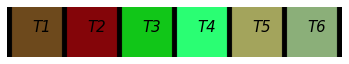

In [20]:
# Esta función recibe una lista de las matrices de cada clase
def trainingBayess(matrices_clases):
    # Entrenamiento
    MUs = []
    SIGMAs_inv = []
    probas = []
    ldDers = []
    colores = []
    for clase in matrices_clases:
        MU = np.mean(clase, axis=0)
        MUs.append(MU)
        SIGMA = getSigma(clase)
        SIGMA_inv = np.linalg.inv(SIGMA)
        SIGMAs_inv.append(SIGMA_inv)
        proba = probaClase(len(clase), clase.shape[0], clase.shape[1], len(matrices_clases))
        probas.append(proba)
        ldDer = ladoDerecho(np.linalg.det(SIGMA), proba)
        ldDers.append(ldDer)
        colores.append((np.random.rand(3)*1000%255).astype(int).tolist())
    mostrarColores(colores)
    return MUs, SIGMAs_inv, ldDers, colores
entrenamiento = trainingBayess([vectCaractTx1,vectCaractTx2,vectCaractTx3,vectCaractTx4,vectCaractTx5,vectCaractTx6])

#### Pruebas

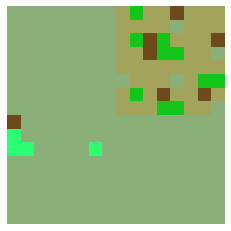

In [21]:
imgPrueba1 = io.imread('texturas/imgCompuesta1.png')
imgPC = vectorizador(np.array(imgPrueba1),20,20,length_overlap=0,height_overlap=0)
resultado1 = clasificador(imgPC, entrenamiento[0], entrenamiento[1], entrenamiento[2], entrenamiento[3])
plt.imshow(resultado1)
plt.axis('off')
plt.show()

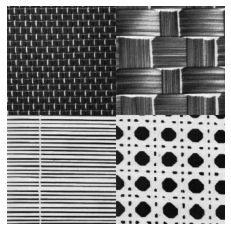

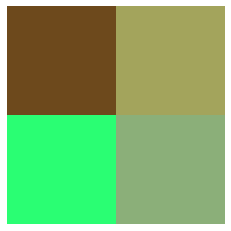

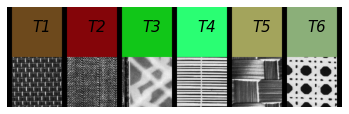

In [22]:
imgPrueba1 = io.imread('texturas/imgCompuesta1.png')
imgPC = vectorizador(np.array(imgPrueba1),80,80,length_overlap=0,height_overlap=0)
resultado1 = clasificador(imgPC, entrenamiento[0], entrenamiento[1], entrenamiento[2], entrenamiento[3])
plt.imshow(imgPrueba1, cmap=plt.cm.gray)
plt.axis('off')
plt.show()
plt.imshow(resultado1)
plt.axis('off')
plt.show()
mostrarColores(entrenamiento[3], texturas=texturas_array)

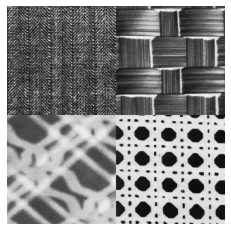

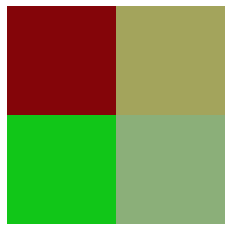

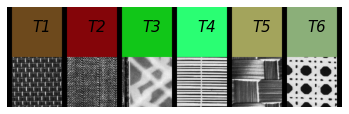

In [23]:
imgPrueba2 = io.imread('texturas/imgCompuesta2.png')
imgPC2 = vectorizador(np.array(imgPrueba2),80,80,length_overlap=0,height_overlap=0)
resultado2 = clasificador(imgPC2, entrenamiento[0], entrenamiento[1], entrenamiento[2], entrenamiento[3])
plt.imshow(imgPrueba2, cmap=plt.cm.gray)
plt.axis('off')
plt.show()
plt.imshow(resultado2)
plt.axis('off')
plt.show()
mostrarColores(entrenamiento[3], texturas=texturas_array)

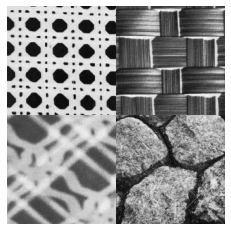

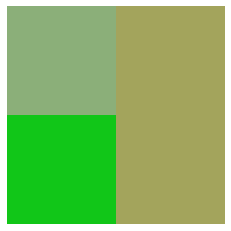

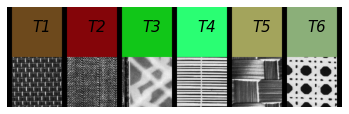

In [24]:
imgPrueba3 = io.imread('texturas/imgCompuesta3.png')
imgPC3 = vectorizador(np.array(imgPrueba3),80,80,length_overlap=0,height_overlap=0)
resultado3 = clasificador(imgPC3, entrenamiento[0], entrenamiento[1], entrenamiento[2], entrenamiento[3])
plt.imshow(imgPrueba3, cmap=plt.cm.gray)
plt.axis('off')
plt.show()
plt.imshow(resultado3)
plt.axis('off')
plt.show()
mostrarColores(entrenamiento[3], texturas=texturas_array)

***

### Clasificación con KNN

In [25]:
# Preprocesamiento para ajustar con la funcion de knn de scikitlearn
def unificador(lista_vect):
    vect_array = []
    label_array = []
    n = 0
    for vect in lista_vect:
        n += 1
        for i in range(len(vect)):
            vect_array.append(vect[i])
            label_array.append(n)
    return vect_array, label_array
samp_feat, samp_lab = unificador([vectCaractTx1,vectCaractTx2,vectCaractTx3,vectCaractTx4,vectCaractTx5,vectCaractTx6])

#### Entrenamiento

In [26]:
model = KNeighborsClassifier()
model.fit(samp_feat,samp_lab)

KNeighborsClassifier()

#### Transformación de datos

In [27]:
vectIMG1 = pixelsImage(imgPC)
vectIMG2 = pixelsImage(imgPC2)
vectIMG3 = pixelsImage(imgPC3)

#### Pruebas

In [28]:
def mostrarKNN(clasificacion, forma, colores):
    resultado = np.zeros((forma[0],forma[1],3), dtype=int)
    aux = 0
    for i in range(len(resultado)):
        for j in range(len(resultado[i])):
            resultado[i][j]= colores[clasificacion[aux]-1]
            aux += 1
    plt.imshow(resultado)
    plt.axis('off')
    plt.show()
    return resultado

In [29]:
clasificacion = model.predict(vectIMG1)
clasificacion

array([1, 1, 5, 5, 1, 1, 5, 5, 4, 5, 6, 6, 3, 5, 6, 6])

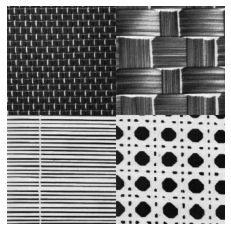

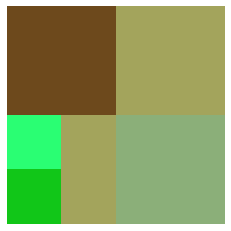

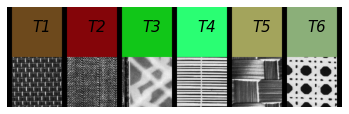

In [30]:
clasificacion1 = model.predict(vectIMG1)
plt.imshow(imgPrueba1, cmap=plt.cm.gray)
plt.axis('off')
plt.show()
mostrarKNN(clasificacion, imgPC.shape, entrenamiento[3])
mostrarColores(entrenamiento[3], texturas=texturas_array)

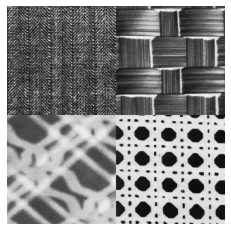

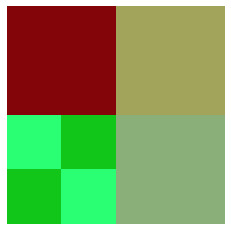

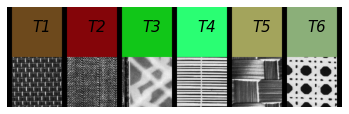

In [31]:
clasificacion2 = model.predict(vectIMG2)
plt.imshow(imgPrueba2, cmap=plt.cm.gray)
plt.axis('off')
plt.show()
mostrarKNN(clasificacion2, imgPC2.shape, entrenamiento[3])
mostrarColores(entrenamiento[3], texturas=texturas_array)

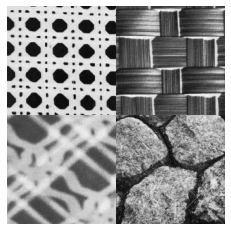

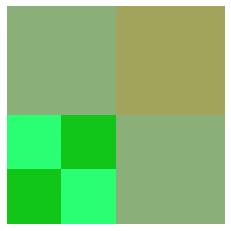

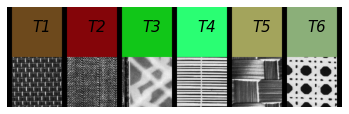

In [32]:
clasificacion3 = model.predict(vectIMG3)
plt.imshow(imgPrueba3, cmap=plt.cm.gray)
plt.axis('off')
plt.show()
mostrarKNN(clasificacion3, imgPC3.shape, entrenamiento[3])
mostrarColores(entrenamiento[3], texturas=texturas_array)

### Conclusiones

Al haber óptimo.


https://www.pyimagesearch.com/2016/08/08/k-nn-classifier-for-image-classification/
https://www.datacamp.com/community/tutorials/k-nearest-neighbor-classification-scikit-learn
https://realpython.com/knn-python/

### Referencias:

- (s.a) (s.f) _matplotlib.pyplot.plot_ Documentación de Matplotlib. Consultado de 
https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.plot.html

- (s.a) (s.f) _matplotlib.contour.QuadContourSet_ Documentación de Matplotlib. Consultado de 
https://matplotlib.org/stable/api/contour_api.html#matplotlib.contour.QuadContourSet

- (s.a) (s.f) _matplotlib.image.AxesImage_ Documentación de Matplotlib. Consultado de 
https://matplotlib.org/stable/api/image_api.html#matplotlib.image.AxesImage

- (s.a) (s.f) _matplotlib.pyplot.imshow_ Documentación de Matplotlib. Consultado de 
https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html

- (s.a) (s.f) _matplotlib.patches.Patch._ Documentación de Matplotlib. Consultado de 
https://matplotlib.org/stable/api/_as_gen/matplotlib.patches.Patch.html

- (s.a) (s.f) Shapely and geometric objects. Consultado de https://automating-gis-processes.github.io/site/notebooks/L1/geometric-objects.html

- (s.a) (s.f) _matplotlib.path._ Documentación de Matplotlib. Consultado de https://matplotlib.org/stable/api/path_api.html

- (s.a) (s.f) _matplotlib.pyplot.plot._ Documentación de Matplotlib. Consultado de https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.plot.html

- (s.a) (s.f) Image Resolution and DPI. Consultado de https://largeprinting.com/resources/image-resolution-and-dpi.html

- (s.a)(26 de dic, 2020) Apply a Gauss filter to an image with Python. Geeks for Geeks. Consultado de
https://www.geeksforgeeks.org/apply-a-gauss-filter-to-an-image-with-python/

- (s.a) (14 de julio, 2019) _Python PIL | GaussianBlur() method._ Geeks for Geeks. Consultado de https://www.geeksforgeeks.org/python-pil-gaussianblur-method/

- gene (13 de abril, 2017) _Geopandas Polygon to matplotlib patches Polygon conversion_ Stack Exchange. Consultado de https://gis.stackexchange.com/questions/197945/geopandas-polygon-to-matplotlib-patches-polygon-conversion

- gene (4 de junio, 2014). _Converting Matplotlib contour objects to Shapely objects._ Stack Overflow. Consultado de https://gis.stackexchange.com/questions/99917/converting-matplotlib-contour-objects-to-shapely-objects

- Gillies, S.(27 de sep, 2020) _The Shapely User Manual._ Shapely. Consultado de https://shapely.readthedocs.io/en/stable/manual.html

- jodag. (6 de mayo, 2020) _Matplotlib - unable to save image in same resolution as original image._ Stack Overflow. Consultado de https://stackoverflow.com/questions/34768717/matplotlib-unable-to-save-image-in-same-resolution-as-original-image#34769840

- Ghandi, R. (5 de Mayo, 2018) _Naive Bayes Classifier_ Towards Data Science. Consultado de https://towardsdatascience.com/naive-bayes-classifier-81d512f50a7c

- tom10 (23 de Marzo, 2015) Python - convert contours to image. Stack Overflow. Consultado de
https://stackoverflow.com/questions/29213238/python-convert-contours-to-image#29214175

